# Original Data

## Imports and Device Setup

In [ ]:
# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms, models
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from sklearn.metrics import precision_score, recall_score, f1_score  # For evaluation metrics

# Set device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cuda


## Data Loading and Preprocessing

In [ ]:
import os

data_dir = "/kaggle/input/original-dataset/Original Dataset"
classes = os.listdir(data_dir)
for cls in classes:
    print(f"Class: {cls}, Number of Images: {len(os.listdir(os.path.join(data_dir, cls)))}")

Class: Citrus Canker, Number of Images: 178
Class: Dry Leaf, Number of Images: 186
Class: Curl Virus, Number of Images: 115
Class: Healthy Leaf, Number of Images: 210
Class: Anthracnose, Number of Images: 100
Class: Bacterial Blight, Number of Images: 105
Class: Sooty Mould, Number of Images: 153
Class: Spider Mites, Number of Images: 114
Class: Deficiency Leaf, Number of Images: 193


In [ ]:
from PIL import Image

image_sizes = []
for cls in classes:
    for img_file in os.listdir(os.path.join(data_dir, cls)):
        img = Image.open(os.path.join(data_dir, cls, img_file))
        image_sizes.append(img.size)

print(set(image_sizes))

{(1000, 1000)}


In [ ]:
# ------------------------------------------
# Data Loader (Adjust the path)
# ------------------------------------------
data_dir = '/kaggle/input/original-dataset/Original Dataset'  # Change this path as needed

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

"""

# Load dataset and split into training and validation sets
dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_set, val_set = random_split(dataset, [train_size, val_size])

"""

# Load dataset
dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
train_size = int(0.7 * len(dataset))
val_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])


# Apply test transformation to validation and test sets

val_dataset.dataset.transform = transform
test_dataset.dataset.transform = transform

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


print("Number of classes:", num_classes)
print("Number of Total Size:", len(dataset))
print("Number of Train Size:", train_size)
print("Number of Validation Size:", val_size)
print("Number of Test Size:", test_size)


Number of classes: 9
Number of Total Size: 1354
Number of Train Size: 947
Number of Validation Size: 270
Number of Test Size: 137


## Optional - Batch Plotting Function

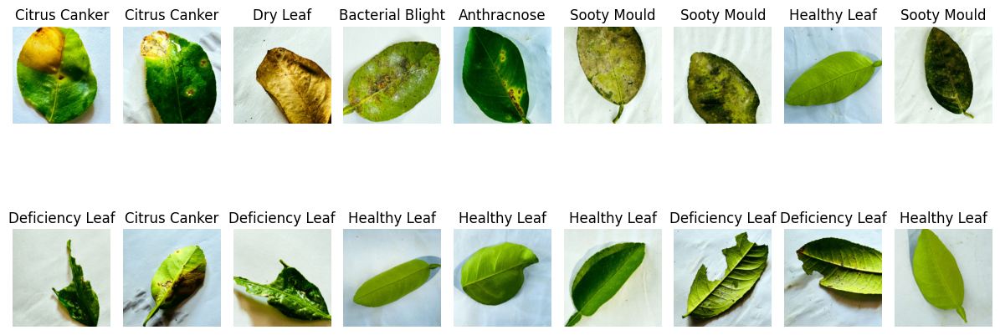

In [ ]:
# ------------------------------------------
# Plot function for batches (optional)
# ------------------------------------------
def plot_batch(loader, classes):
    images, labels = next(iter(loader))
    plt.figure(figsize=(12,6))
    for i in range(min(18, len(images))):
        # Undo normalization for display purposes
        img = images[i].permute(1,2,0).numpy() * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
        plt.subplot(2,9,i+1)
        plt.imshow(img.clip(0,1))
        plt.title(classes[labels[i]])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Example batch plotting
plot_batch(val_loader, dataset.classes)


## Define Base Models

In [ ]:
# ------------------------------------------
# Define Base Models
# ------------------------------------------
def get_model(model_name, num_classes):
    model = getattr(models, model_name)(pretrained=True)
    if 'resnet' in model_name:
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif 'efficientnet' in model_name or 'mobilenet' in model_name:
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    elif 'densenet' in model_name:
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)
    return model.to(device)

# List of model names to use
model_names = ['resnet50', 'efficientnet_b0', 'mobilenet_v2', 'densenet121']
models_list = [get_model(name, num_classes) for name in model_names]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 189MB/s]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed i

## Weighted Ensemble and Training Ensemble Weights


In [ ]:
class EnsembleModel(nn.Module):
    def __init__(self, models):
        super(EnsembleModel, self).__init__()
        self.models = nn.ModuleList(models)
        self.weights = nn.Parameter(torch.ones(len(models)))

    def forward(self, x):
        outputs = torch.stack([model(x) for model in self.models])
        weights = torch.softmax(self.weights, dim=0).view(-1, 1, 1)
        return torch.sum(outputs * weights, dim=0)

ensemble_model = EnsembleModel(models_list).to(device)

def train_ensemble_weights(ensemble, loader, max_epochs=50, patience=5):
    optimizer = optim.Adam([ensemble.weights], lr=1e-3)
    best_val_loss = float('inf')
    patience_counter = 0
    best_state = None

    for epoch in range(max_epochs):
        ensemble.train()
        total_loss, correct = 0.0, 0
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = ensemble(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels).item()
        train_loss = total_loss / len(loader.dataset)
        train_acc = correct / len(loader.dataset)

        # Validation phase
        ensemble.eval()
        val_loss, val_correct = 0.0, 0
        with torch.no_grad():
            for images, labels in loader:
                images, labels = images.to(device), labels.to(device)
                outputs = ensemble(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += torch.sum(preds == labels).item()
        val_loss /= len(loader.dataset)
        val_acc = val_correct / len(loader.dataset)

        print(f"Ensemble weights Epoch {epoch+1}/{max_epochs} | "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            best_state = ensemble.weights.detach().clone()
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered for ensemble weights after {epoch+1} epochs")
                ensemble.weights.data.copy_(best_state)
                break

train_ensemble_weights(ensemble_model, val_loader, max_epochs=50, patience=5)


Ensemble weights Epoch 1/50 | Train Loss: 0.0089, Train Acc: 1.0000 | Val Loss: 0.0025, Val Acc: 1.0000
Ensemble weights Epoch 2/50 | Train Loss: 0.0098, Train Acc: 1.0000 | Val Loss: 0.0026, Val Acc: 1.0000
Ensemble weights Epoch 3/50 | Train Loss: 0.0095, Train Acc: 1.0000 | Val Loss: 0.0028, Val Acc: 1.0000
Ensemble weights Epoch 4/50 | Train Loss: 0.0099, Train Acc: 1.0000 | Val Loss: 0.0030, Val Acc: 1.0000
Ensemble weights Epoch 5/50 | Train Loss: 0.0087, Train Acc: 1.0000 | Val Loss: 0.0029, Val Acc: 1.0000
Ensemble weights Epoch 6/50 | Train Loss: 0.0094, Train Acc: 1.0000 | Val Loss: 0.0032, Val Acc: 1.0000
Early stopping triggered for ensemble weights after 6 epochs


## Evaluation of Models

In [ ]:
from sklearn.metrics import accuracy_score

def evaluate_model(model, loader):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return np.array(all_labels), np.array(all_preds)

# Evaluate each base model
for model in models_list:
    true_labels, predictions = evaluate_model(model, val_loader)
    precision = precision_score(true_labels, predictions, average='weighted')
    recall = recall_score(true_labels, predictions, average='weighted')
    f1 = f1_score(true_labels, predictions, average='weighted')
    print(f"{model.__class__.__name__} -> Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

    # Evaluate on test set
    test_labels, test_predictions = evaluate_model(model, test_loader)
    test_acc = accuracy_score(test_labels, test_predictions)
    print(f"{model.__class__.__name__} -> Test Accuracy: {test_acc:.4f}")

# Evaluate the ensemble model
true_labels, predictions = evaluate_model(ensemble_model, val_loader)
precision = precision_score(true_labels, predictions, average='weighted')
recall = recall_score(true_labels, predictions, average='weighted')
f1 = f1_score(true_labels, predictions, average='weighted')
print(f"EnsembleModel -> Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

# Evaluate ensemble model on test set
test_labels, test_predictions = evaluate_model(ensemble_model, test_loader)
test_acc = accuracy_score(test_labels, test_predictions)
print(f"EnsembleModel -> Test Accuracy: {test_acc:.4f}")


ResNet -> Precision: 1.0000, Recall: 1.0000, F1 Score: 1.0000
ResNet -> Test Accuracy: 1.0000
EfficientNet -> Precision: 1.0000, Recall: 1.0000, F1 Score: 1.0000
EfficientNet -> Test Accuracy: 1.0000
MobileNetV2 -> Precision: 1.0000, Recall: 1.0000, F1 Score: 1.0000
MobileNetV2 -> Test Accuracy: 1.0000
DenseNet -> Precision: 0.9965, Recall: 0.9963, F1 Score: 0.9963
DenseNet -> Test Accuracy: 1.0000
EnsembleModel -> Precision: 1.0000, Recall: 1.0000, F1 Score: 1.0000
EnsembleModel -> Test Accuracy: 1.0000


## Confusion Matrix for Each Model

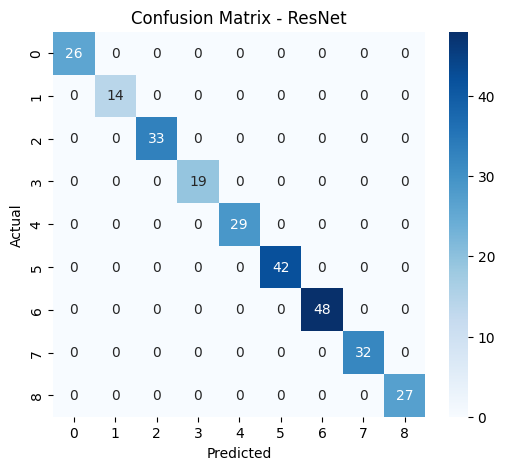

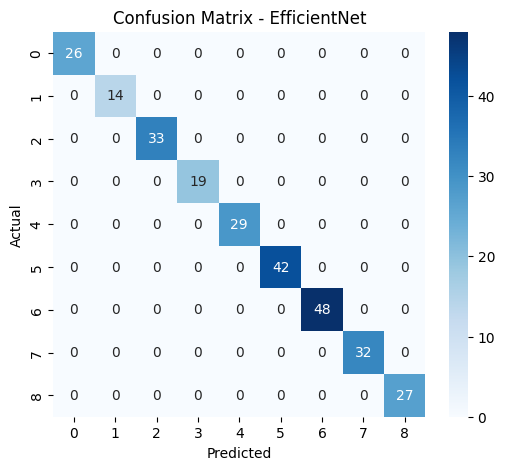

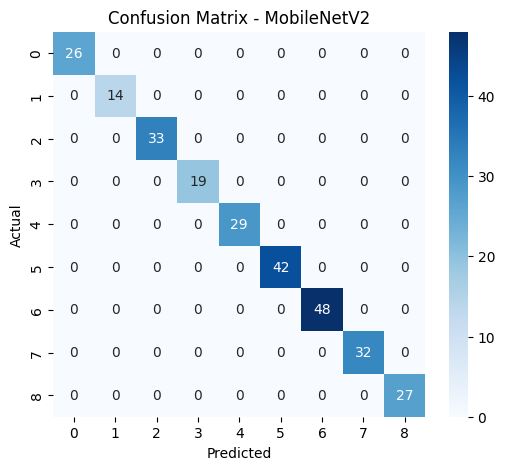

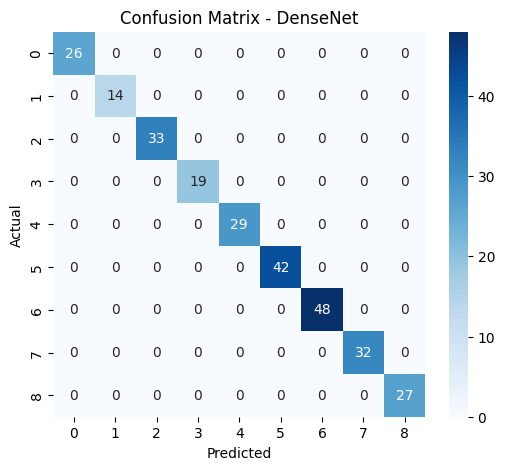

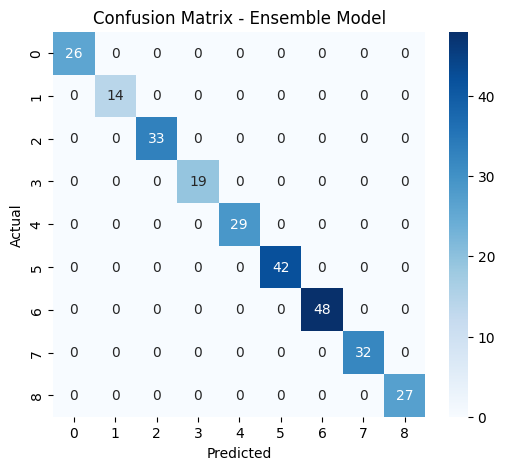

In [ ]:

# ------------------------------------------
# Evaluate Models with Precision, Recall, F1 Score, and Confusion Matrix
# ------------------------------------------
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


# Evaluate each base model
for model in models_list:
    # Confusion Matrix
    cm = confusion_matrix(true_labels, predictions)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model.__class__.__name__}')
    plt.show()

# Confusion Matrix for Ensemble Model
cm = confusion_matrix(true_labels, predictions)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Ensemble Model')
plt.show()


## Grad-CAM Visualization

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


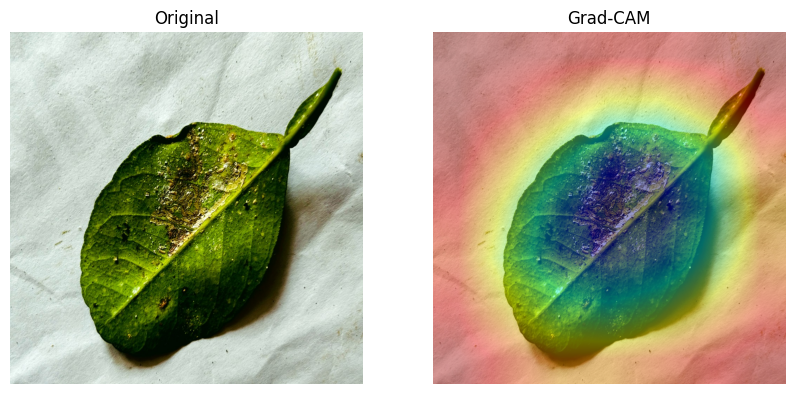

In [ ]:
# ------------------------------------------
# XAI: Grad-CAM Visualization
# ------------------------------------------
def visualize_gradcam(img_path, ensemble, models_list):
    ensemble.eval()
    img = Image.open(img_path).convert('RGB')
    input_tensor = transform(img).unsqueeze(0).to(device)

    heatmaps = []
    weights = torch.softmax(ensemble.weights, dim=0).detach().cpu().numpy()

    target_layers = [
        models_list[0].layer4[-1],
        models_list[1].features[-1],
        models_list[2].features[-1],
        models_list[3].features[-1]
    ]

    for model, layer, w in zip(models_list, target_layers, weights):
        grads, acts = None, None
        def forward_hook(module, inp, out):
            nonlocal acts
            acts = out.detach()
        def backward_hook(module, gin, gout):
            nonlocal grads
            grads = gout[0].detach()

        hook_f = layer.register_forward_hook(forward_hook)
        hook_b = layer.register_backward_hook(backward_hook)

        model.zero_grad()
        out = model(input_tensor)
        out[:, out.argmax(dim=1)].backward()

        pooled_grad = grads.mean([0, 2, 3])
        cam = (acts[0] * pooled_grad[:, None, None]).sum(0).relu()
        cam = cam / cam.max()
        heatmaps.append(w * cam.cpu().numpy())

        hook_f.remove()
        hook_b.remove()

    final_heatmap = np.sum(heatmaps, axis=0)
    final_heatmap = cv2.resize(final_heatmap, (img.width, img.height))
    heatmap = cv2.applyColorMap(np.uint8(255 * final_heatmap), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(np.array(img), 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title('Original')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title('Grad-CAM')
    plt.axis('off')
    plt.show()

# Example usage:
img_path = '/kaggle/input/original-dataset/Original Dataset/Bacterial Blight/bacterial_blight00001.JPG'
visualize_gradcam(img_path, ensemble_model, models_list)


## Ablation-CAM Visualization

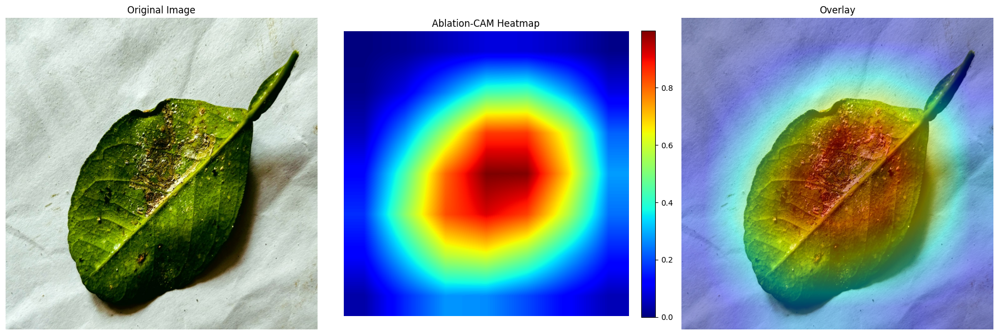

In [ ]:
def visualize_ablationcam_improved(img_path, ensemble, models_list, colormap=cv2.COLORMAP_JET, alpha=0.4):
    """
    Improved Ablation-CAM visualization that shows:
      - Original image
      - Ensemble Ablation-CAM heatmap with a colorbar
      - Overlay of the heatmap on the original image

    Args:
      img_path (str): Path to the input image.
      ensemble (nn.Module): The ensemble model containing the weights.
      models_list (list): List of base models.
      colormap: OpenCV colormap to apply (default: cv2.COLORMAP_JET).
      alpha (float): Transparency factor for overlay blending.
    """
    ensemble.eval()
    # Load and preprocess image
    img = Image.open(img_path).convert('RGB')
    input_tensor = transform(img).unsqueeze(0).to(device)

    heatmaps = []
    # Get ensemble weights as probabilities
    weights = torch.softmax(ensemble.weights, dim=0).detach().cpu().numpy()

    # Define target layers from each model
    target_layers = [
        models_list[0].layer4[-1],
        models_list[1].features[-1],
        models_list[2].features[-1],
        models_list[3].features[-1]
    ]

    # Compute Ablation-CAM for each model
    for model, layer, w in zip(models_list, target_layers, weights):
        # Capture the activation for the forward pass.
        activation = None
        def forward_hook(module, inp, out):
            nonlocal activation
            activation = out.detach()
        hook = layer.register_forward_hook(forward_hook)
        output = model(input_tensor)
        predicted_class = output.argmax(dim=1).item()
        original_score = output[0, predicted_class].item()
        hook.remove()

        # Compute channel importance via ablation.
        channel_importance = []
        num_channels = activation.shape[1]
        for c in range(num_channels):
            def ablate_hook(module, inp, out):
                ablated = out.clone()
                ablated[:, c, :, :] = 0
                return ablated
            hook = layer.register_forward_hook(ablate_hook)
            output_ablated = model(input_tensor)
            ablated_score = output_ablated[0, predicted_class].item()
            importance = original_score - ablated_score
            channel_importance.append(importance)
            hook.remove()
        channel_importance = torch.tensor(channel_importance, device=device)

        # Aggregate the activation maps weighted by the channel importance.
        weighted_activation = (activation[0] * channel_importance.view(-1, 1, 1)).sum(dim=0)
        cam = weighted_activation.relu()
        # Normalize the cam to [0,1]
        cam_min, cam_max = cam.min(), cam.max()
        if cam_max - cam_min > 0:
            cam = (cam - cam_min) / (cam_max - cam_min)
        else:
            cam = torch.zeros_like(cam)
        heatmaps.append(w * cam.cpu().numpy())

    # Aggregate and normalize heatmaps from all models.
    ensemble_heatmap = np.sum(heatmaps, axis=0)
    heat_min, heat_max = ensemble_heatmap.min(), ensemble_heatmap.max()
    if heat_max - heat_min > 0:
        ensemble_heatmap = (ensemble_heatmap - heat_min) / (heat_max - heat_min)
    else:
        ensemble_heatmap = np.zeros_like(ensemble_heatmap)

    # Resize the heatmap to the image size.
    ensemble_heatmap_resized = cv2.resize(ensemble_heatmap, (img.width, img.height))

    # Apply colormap and convert to RGB.
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * ensemble_heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Create overlay image.
    img_np = np.array(img)
    overlay = cv2.addWeighted(img_np, 1 - alpha, heatmap_colored, alpha, 0)

    # Plotting: Original, Heatmap (with colorbar), and Overlay.
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].imshow(img)
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    im = axs[1].imshow(ensemble_heatmap_resized, cmap='jet')
    axs[1].set_title('Ablation-CAM Heatmap')
    axs[1].axis('off')
    fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)

    axs[2].imshow(overlay)
    axs[2].set_title('Overlay')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()


# Example usage:
img_path = '/kaggle/input/original-dataset/Original Dataset/Bacterial Blight/bacterial_blight00001.JPG'
visualize_ablationcam_improved(img_path, ensemble_model, models_list)


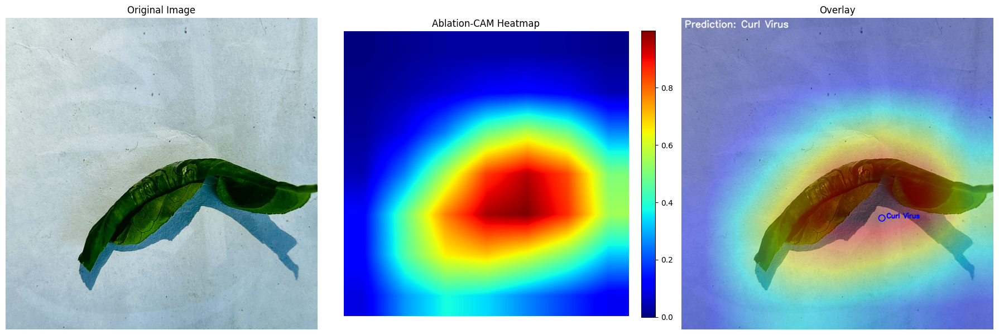

In [ ]:
def visualize_ablationcam_improved(img_path, ensemble, models_list, colormap=cv2.COLORMAP_JET, alpha=0.4, class_names=None):
    """
    Improved Ablation-CAM visualization that shows:
      - Original image
      - Ensemble Ablation-CAM heatmap with a colorbar
      - Overlay of the heatmap on the original image with predicted class annotations

    Args:
      img_path (str): Path to the input image.
      ensemble (nn.Module): The ensemble model containing the weights.
      models_list (list): List of base models.
      colormap: OpenCV colormap to apply (default: cv2.COLORMAP_JET).
      alpha (float): Transparency factor for overlay blending.
      class_names (dict or list, optional): Mapping of class indices to class names.
    """
    ensemble.eval()
    # Load and preprocess image
    img = Image.open(img_path).convert('RGB')
    input_tensor = transform(img).unsqueeze(0).to(device)

    # Compute ensemble prediction for annotation.
    ensemble_output = ensemble(input_tensor)
    ensemble_pred = ensemble_output.argmax(dim=1).item()
    label_text = class_names[ensemble_pred] if class_names is not None else str(ensemble_pred)

    heatmaps = []
    # Get ensemble weights as probabilities
    weights = torch.softmax(ensemble.weights, dim=0).detach().cpu().numpy()

    # Define target layers from each model
    target_layers = [
        models_list[0].layer4[-1],
        models_list[1].features[-1],
        models_list[2].features[-1],
        models_list[3].features[-1]
    ]

    # Compute Ablation-CAM for each model
    for model, layer, w in zip(models_list, target_layers, weights):
        # Capture the activation for the forward pass.
        activation = None
        def forward_hook(module, inp, out):
            nonlocal activation
            activation = out.detach()
        hook = layer.register_forward_hook(forward_hook)
        output = model(input_tensor)
        # Use the predicted class of each base model for ablation.
        predicted_class = output.argmax(dim=1).item()
        original_score = output[0, predicted_class].item()
        hook.remove()

        # Compute channel importance via ablation.
        channel_importance = []
        num_channels = activation.shape[1]
        for c in range(num_channels):
            def ablate_hook(module, inp, out):
                ablated = out.clone()
                ablated[:, c, :, :] = 0
                return ablated
            hook = layer.register_forward_hook(ablate_hook)
            output_ablated = model(input_tensor)
            ablated_score = output_ablated[0, predicted_class].item()
            importance = original_score - ablated_score
            channel_importance.append(importance)
            hook.remove()
        channel_importance = torch.tensor(channel_importance, device=device)

        # Aggregate the activation maps weighted by the channel importance.
        weighted_activation = (activation[0] * channel_importance.view(-1, 1, 1)).sum(dim=0)
        cam = weighted_activation.relu()
        # Normalize the cam to [0,1]
        cam_min, cam_max = cam.min(), cam.max()
        if cam_max - cam_min > 0:
            cam = (cam - cam_min) / (cam_max - cam_min)
        else:
            cam = torch.zeros_like(cam)
        heatmaps.append(w * cam.cpu().numpy())

    # Aggregate and normalize heatmaps from all models.
    ensemble_heatmap = np.sum(heatmaps, axis=0)
    heat_min, heat_max = ensemble_heatmap.min(), ensemble_heatmap.max()
    if heat_max - heat_min > 0:
        ensemble_heatmap = (ensemble_heatmap - heat_min) / (heat_max - heat_min)
    else:
        ensemble_heatmap = np.zeros_like(ensemble_heatmap)

    # Resize the heatmap to the image size.
    ensemble_heatmap_resized = cv2.resize(ensemble_heatmap, (img.width, img.height))

    # Apply colormap and convert to RGB.
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * ensemble_heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Create overlay image.
    img_np = np.array(img)
    overlay = cv2.addWeighted(img_np, 1 - alpha, heatmap_colored, alpha, 0)

    # Annotate the predicted class on the overlay.
    cv2.putText(overlay, f'Prediction: {label_text}', (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

    # Find the area with the highest activation and annotate it.
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(ensemble_heatmap_resized)
    cv2.circle(overlay, max_loc, 10, (0, 0, 255), 2)
    cv2.putText(overlay, label_text, (max_loc[0] + 15, max_loc[1]),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2, cv2.LINE_AA)

    # Plotting: Original, Heatmap (with colorbar), and Overlay.
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].imshow(img)
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    im = axs[1].imshow(ensemble_heatmap_resized, cmap='jet')
    axs[1].set_title('Ablation-CAM Heatmap')
    axs[1].axis('off')
    fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)

    axs[2].imshow(overlay)
    axs[2].set_title('Overlay')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:
# Optionally provide a class_names mapping (e.g., a dict or list)
img_path = '/kaggle/input/original-dataset/Original Dataset/Curl Virus/curl_virus00004.JPG'
visualize_ablationcam_improved(img_path, ensemble_model, models_list,class_names={0: "Anthracnose",
                                                                     1: "Bacterial Blight",
                                                                     2: "Citrus Canker",
                                                                     3: "Curl Virus",
                                                                     4: "Deficiency Leaf",
                                                                     5: "Dry Leaf",
                                                                     6: "Healthy Leaf",
                                                                     7: "Sooty Mould",
                                                                     8: "Spider Mites"})

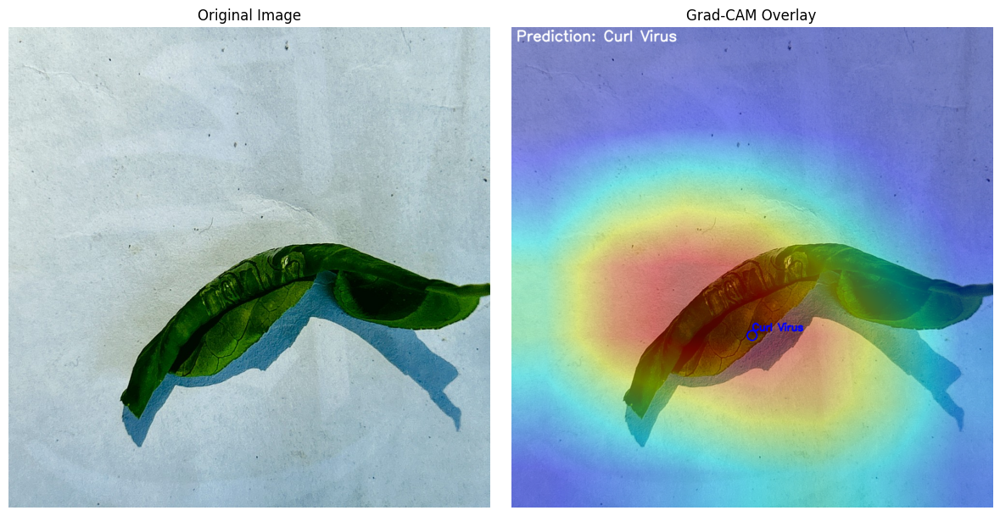

In [ ]:
def visualize_gradcam(img_path, ensemble, models_list, class_names=None):
    ensemble.eval()
    # Load and preprocess image
    img = Image.open(img_path).convert('RGB')
    input_tensor = transform(img).unsqueeze(0).to(device)

    # Get ensemble prediction and label
    ensemble_output = ensemble(input_tensor)
    pred_class = ensemble_output.argmax(dim=1).item()
    if class_names is not None:
        label_text = class_names[pred_class]
    else:
        label_text = str(pred_class)

    heatmaps = []
    weights = torch.softmax(ensemble.weights, dim=0).detach().cpu().numpy()

    target_layers = [
        models_list[0].layer4[-1],
        models_list[1].features[-1],
        models_list[2].features[-1],
        models_list[3].features[-1]
    ]

    # Compute Grad-CAM for each model in the ensemble
    for model, layer, w in zip(models_list, target_layers, weights):
        grads, acts = None, None

        # Hook functions to capture activations and gradients
        def forward_hook(module, inp, out):
            nonlocal acts
            acts = out.detach()
        def backward_hook(module, gin, gout):
            nonlocal grads
            grads = gout[0].detach()

        hook_f = layer.register_forward_hook(forward_hook)
        hook_b = layer.register_backward_hook(backward_hook)

        model.zero_grad()
        out = model(input_tensor)
        # Backward pass using the score of the predicted class
        out[:, out.argmax(dim=1)].backward()

        # Compute the Grad-CAM heatmap for the current model
        pooled_grad = grads.mean([0, 2, 3])
        cam = (acts[0] * pooled_grad[:, None, None]).sum(0).relu()
        cam = cam / cam.max()
        heatmaps.append(w * cam.cpu().numpy())

        hook_f.remove()
        hook_b.remove()

    # Combine the weighted heatmaps from each model
    final_heatmap = np.sum(heatmaps, axis=0)
    final_heatmap = cv2.resize(final_heatmap, (img.width, img.height))

    # Create a color heatmap and convert to RGB for correct display
    heatmap = cv2.applyColorMap(np.uint8(255 * final_heatmap), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(np.array(img), 0.6, heatmap_rgb, 0.4, 0)

    # Annotate the predicted class label on the overlay
    cv2.putText(overlay, f'Prediction: {label_text}', (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

    # Find the area with the highest activation and annotate it
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(final_heatmap)
    cv2.circle(overlay, max_loc, 10, (0, 0, 255), 2)
    cv2.putText(overlay, f'{label_text}', (max_loc[0], max_loc[1]-10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2, cv2.LINE_AA)

    # Plot original image and Grad-CAM overlay
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title('Grad-CAM Overlay')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Example usage:

img_path = '/kaggle/input/original-dataset/Original Dataset/Curl Virus/curl_virus00004.JPG'
visualize_gradcam(img_path, ensemble_model, models_list,class_names={0: "Anthracnose",
                                                                     1: "Bacterial Blight",
                                                                     2: "Citrus Canker",
                                                                     3: "Curl Virus",
                                                                     4: "Deficiency Leaf",
                                                                     5: "Dry Leaf",
                                                                     6: "Healthy Leaf",
                                                                     7: "Sooty Mould",
                                                                     8: "Spider Mites"})

# Augmented Data


## Imports and Device Setup

In [ ]:
# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms, models
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from sklearn.metrics import precision_score, recall_score, f1_score  # For evaluation metrics

# Set device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cuda


## Data Loading and Preprocessing

In [ ]:
import os

data_dir = "/kaggle/input/lemon-leaf-disease-dataset/Augmented Dataset/Aumented Dataset"
classes = os.listdir(data_dir)
for cls in classes:
    print(f"Class: {cls}, Number of Images: {len(os.listdir(os.path.join(data_dir, cls)))}")

Class: Citrus Canker, Number of Images: 1000
Class: Dry Leaf, Number of Images: 1000
Class: Curl Virus, Number of Images: 1000
Class: Healthy Leaf, Number of Images: 1000
Class: Anthracnose, Number of Images: 1000
Class: Bacterial Blight, Number of Images: 1000
Class: Sooty Mould, Number of Images: 1000
Class: Spider Mites, Number of Images: 1000
Class: Deficiency Leaf, Number of Images: 1000


In [ ]:
from PIL import Image

image_sizes = []
for cls in classes:
    for img_file in os.listdir(os.path.join(data_dir, cls)):
        img = Image.open(os.path.join(data_dir, cls, img_file))
        image_sizes.append(img.size)

print(set(image_sizes))

{(1000, 1000)}


In [ ]:
# ------------------------------------------
# Data Loader (Adjust the path)
# ------------------------------------------
data_dir = '/kaggle/input/lemon-leaf-disease-dataset/Augmented Dataset/Aumented Dataset'  # Change this path as needed
""""
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])#

"""

"""

# Load dataset and split into training and validation sets
dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_set, val_set = random_split(dataset, [train_size, val_size])

"""

# Load dataset
dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
train_size = int(0.7 * len(dataset))
val_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])


# Apply test transformation to validation and test sets

val_dataset.dataset.transform = transform
test_dataset.dataset.transform = transform

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


print("Number of classes:", num_classes)
print("Number of Total Size:", len(dataset))
print("Number of Train Size:", train_size)
print("Number of Validation Size:", val_size)
print("Number of Test Size:", test_size)


Number of classes: 9
Number of Total Size: 9000
Number of Train Size: 6300
Number of Validation Size: 1800
Number of Test Size: 900


## Optional - Batch Plotting Function

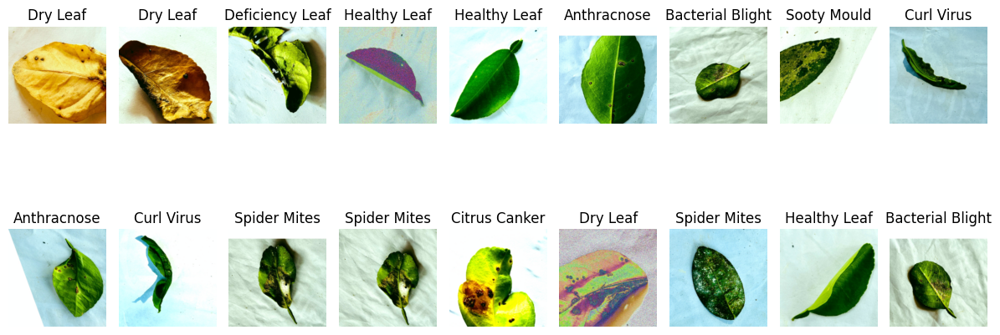

In [ ]:
# ------------------------------------------
# Plot function for batches (optional)
# ------------------------------------------
def plot_batch(loader, classes):
    images, labels = next(iter(loader))
    plt.figure(figsize=(12,6))
    for i in range(min(18, len(images))):
        # Undo normalization for display purposes
        img = images[i].permute(1,2,0).numpy() * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
        plt.subplot(2,9,i+1)
        plt.imshow(img.clip(0,1))
        plt.title(classes[labels[i]])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Example batch plotting
plot_batch(val_loader, dataset.classes)


## Define Base Models

In [ ]:
# ------------------------------------------
# Define Base Models
# ------------------------------------------
def get_model(model_name, num_classes):
    model = getattr(models, model_name)(pretrained=True)
    if 'resnet' in model_name:
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif 'efficientnet' in model_name or 'mobilenet' in model_name:
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    elif 'densenet' in model_name:
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)
    return model.to(device)

# List of model names to use
model_names = ['resnet50', 'efficientnet_b0', 'mobilenet_v2', 'densenet121']
models_list = [get_model(name, num_classes) for name in model_names]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 171MB/s] 
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed 

## Train Base Models with Early Stopping

In [ ]:
# ------------------------------------------
# Train Base Models with Early Stopping
# ------------------------------------------
criterion = nn.CrossEntropyLoss()

def train_model(model, train_loader, val_loader, max_epochs=50, patience=5):
    optimizer = optim.Adamax(model.parameters(), lr=1e-4)
    best_val_loss = float('inf')
    patience_counter = 0
    best_state = None

    for epoch in range(max_epochs):
        model.train()
        total_loss, correct = 0.0, 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels).item()
        train_loss = total_loss / len(train_loader.dataset)
        train_acc = correct / len(train_loader.dataset)

        # Validation phase
        model.eval()
        val_loss,val_correct = 0.0,0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += torch.sum(preds == labels).item()
        val_loss /= len(val_loader.dataset)
        val_acc = val_correct / len(val_loader.dataset)

        print(f"{model.__class__.__name__} Epoch {epoch+1}/{max_epochs} | Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            best_state = model.state_dict()  # Save best model state
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered for {model.__class__.__name__} after {epoch+1} epochs")
                if best_state is not None:
                    model.load_state_dict(best_state)  # Restore best state
                break

# Train each base model
for model in models_list:
    train_model(model, train_loader, val_loader, max_epochs=50, patience=5)


ResNet Epoch 1/50 | Train Loss: 0.2862, Train Acc: 0.9440 | Val Loss: 0.0212, Val Acc: 0.9978
ResNet Epoch 2/50 | Train Loss: 0.0275, Train Acc: 0.9963 | Val Loss: 0.0108, Val Acc: 0.9967
ResNet Epoch 3/50 | Train Loss: 0.0184, Train Acc: 0.9968 | Val Loss: 0.0040, Val Acc: 0.9994
ResNet Epoch 4/50 | Train Loss: 0.0136, Train Acc: 0.9979 | Val Loss: 0.0069, Val Acc: 0.9983
ResNet Epoch 5/50 | Train Loss: 0.0067, Train Acc: 0.9997 | Val Loss: 0.0059, Val Acc: 0.9989
ResNet Epoch 6/50 | Train Loss: 0.0054, Train Acc: 0.9997 | Val Loss: 0.0079, Val Acc: 0.9983
ResNet Epoch 7/50 | Train Loss: 0.0053, Train Acc: 0.9990 | Val Loss: 0.0061, Val Acc: 0.9983
ResNet Epoch 8/50 | Train Loss: 0.0027, Train Acc: 1.0000 | Val Loss: 0.0051, Val Acc: 0.9989
Early stopping triggered for ResNet after 8 epochs
EfficientNet Epoch 1/50 | Train Loss: 1.0906, Train Acc: 0.7903 | Val Loss: 0.2849, Val Acc: 0.9661
EfficientNet Epoch 2/50 | Train Loss: 0.2151, Train Acc: 0.9668 | Val Loss: 0.0681, Val Acc: 0.98

### 10 EPOCHS WITHOUT ES

In [ ]:
# ------------------------------------------
# Train Base Models with Early Stoppingi
# ------------------------------------------
criterion = nn.CrossEntropyLoss()

def train_model(model, train_loader, val_loader, max_epochs=10, patience=2):
    optimizer = optim.Adamax(model.parameters(), lr=1e-4)
    best_val_loss = float('inf')
    patience_counter = 0
    best_state = None

    for epoch in range(max_epochs):
        model.train()
        total_loss, correct = 0.0, 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels).item()
        train_loss = total_loss / len(train_loader.dataset)
        train_acc = correct / len(train_loader.dataset)

        # Validation phase
        model.eval()
        val_loss,val_correct = 0.0,0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += torch.sum(preds == labels).item()
        val_loss /= len(val_loader.dataset)
        val_acc = val_correct / len(val_loader.dataset)

        print(f"{model.__class__.__name__} Epoch {epoch+1}/{max_epochs} | Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
"""
        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            best_state = model.state_dict()  # Save best model state
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered for {model.__class__.__name__} after {epoch+1} epochs")
                if best_state is not None:
                    model.load_state_dict(best_state)  # Restore best state
                break
"""
# Train each base model
for model in models_list:
    train_model(model, train_loader, val_loader, max_epochs=10, patience=2)


ResNet Epoch 1/10 | Train Loss: 0.2833, Train Acc: 0.9446 | Val Loss: 0.0291, Val Acc: 0.9939
ResNet Epoch 2/10 | Train Loss: 0.0298, Train Acc: 0.9959 | Val Loss: 0.0191, Val Acc: 0.9967
ResNet Epoch 3/10 | Train Loss: 0.0167, Train Acc: 0.9975 | Val Loss: 0.0163, Val Acc: 0.9967
ResNet Epoch 4/10 | Train Loss: 0.0076, Train Acc: 0.9997 | Val Loss: 0.0180, Val Acc: 0.9972
ResNet Epoch 5/10 | Train Loss: 0.0064, Train Acc: 0.9992 | Val Loss: 0.0187, Val Acc: 0.9961
ResNet Epoch 6/10 | Train Loss: 0.0073, Train Acc: 0.9992 | Val Loss: 0.0143, Val Acc: 0.9972
ResNet Epoch 7/10 | Train Loss: 0.0054, Train Acc: 0.9995 | Val Loss: 0.0113, Val Acc: 0.9967
ResNet Epoch 8/10 | Train Loss: 0.0045, Train Acc: 0.9994 | Val Loss: 0.0130, Val Acc: 0.9967
ResNet Epoch 9/10 | Train Loss: 0.0022, Train Acc: 0.9997 | Val Loss: 0.0144, Val Acc: 0.9967
ResNet Epoch 10/10 | Train Loss: 0.0031, Train Acc: 0.9994 | Val Loss: 0.0148, Val Acc: 0.9967
EfficientNet Epoch 1/10 | Train Loss: 1.1091, Train Acc: 0.

## Weighted Ensemble and Training Ensemble Weights


In [ ]:
class EnsembleModel(nn.Module):
    def __init__(self, models):
        super(EnsembleModel, self).__init__()
        self.models = nn.ModuleList(models)
        self.weights = nn.Parameter(torch.ones(len(models)))

    def forward(self, x):
        outputs = torch.stack([model(x) for model in self.models])
        weights = torch.softmax(self.weights, dim=0).view(-1, 1, 1)
        return torch.sum(outputs * weights, dim=0)

ensemble_model = EnsembleModel(models_list).to(device)

def train_ensemble_weights(ensemble, loader, max_epochs=50, patience=5):
    optimizer = optim.Adam([ensemble.weights], lr=1e-3)
    best_val_loss = float('inf')
    patience_counter = 0
    best_state = None

    for epoch in range(max_epochs):
        ensemble.train()
        total_loss, correct = 0.0, 0
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = ensemble(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels).item()
        train_loss = total_loss / len(loader.dataset)
        train_acc = correct / len(loader.dataset)

        # Validation phase
        ensemble.eval()
        val_loss, val_correct = 0.0, 0
        with torch.no_grad():
            for images, labels in loader:
                images, labels = images.to(device), labels.to(device)
                outputs = ensemble(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += torch.sum(preds == labels).item()
        val_loss /= len(loader.dataset)
        val_acc = val_correct / len(loader.dataset)

        print(f"Ensemble weights Epoch {epoch+1}/{max_epochs} | "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            best_state = ensemble.weights.detach().clone()
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered for ensemble weights after {epoch+1} epochs")
                ensemble.weights.data.copy_(best_state)
                break

train_ensemble_weights(ensemble_model, val_loader, max_epochs=50, patience=5)


Ensemble weights Epoch 1/50 | Train Loss: 0.0053, Train Acc: 0.9989 | Val Loss: 0.0031, Val Acc: 0.9989
Ensemble weights Epoch 2/50 | Train Loss: 0.0058, Train Acc: 0.9989 | Val Loss: 0.0030, Val Acc: 0.9989
Ensemble weights Epoch 3/50 | Train Loss: 0.0055, Train Acc: 0.9983 | Val Loss: 0.0032, Val Acc: 0.9989
Ensemble weights Epoch 4/50 | Train Loss: 0.0062, Train Acc: 0.9989 | Val Loss: 0.0028, Val Acc: 0.9994
Ensemble weights Epoch 5/50 | Train Loss: 0.0058, Train Acc: 0.9989 | Val Loss: 0.0033, Val Acc: 0.9989
Ensemble weights Epoch 6/50 | Train Loss: 0.0056, Train Acc: 0.9983 | Val Loss: 0.0031, Val Acc: 0.9989
Ensemble weights Epoch 7/50 | Train Loss: 0.0058, Train Acc: 0.9989 | Val Loss: 0.0032, Val Acc: 0.9989
Ensemble weights Epoch 8/50 | Train Loss: 0.0054, Train Acc: 0.9994 | Val Loss: 0.0028, Val Acc: 0.9994
Ensemble weights Epoch 9/50 | Train Loss: 0.0060, Train Acc: 0.9989 | Val Loss: 0.0031, Val Acc: 0.9989
Ensemble weights Epoch 10/50 | Train Loss: 0.0058, Train Acc: 0.

In [ ]:
class EnsembleModel(nn.Module):
    def __init__(self, models):
        super(EnsembleModel, self).__init__()
        self.models = nn.ModuleList(models)
        self.weights = nn.Parameter(torch.ones(len(models)))

    def forward(self, x):
        outputs = torch.stack([model(x) for model in self.models])
        weights = torch.softmax(self.weights, dim=0).view(-1, 1, 1)
        return torch.sum(outputs * weights, dim=0)

ensemble_model = EnsembleModel(models_list).to(device)

def train_ensemble_weights(ensemble, loader, max_epochs=10, patience=2):
    optimizer = optim.Adam([ensemble.weights], lr=1e-3)
    best_val_loss = float('inf')
    patience_counter = 0
    best_state = None

    for epoch in range(max_epochs):
        ensemble.train()
        total_loss, correct = 0.0, 0
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = ensemble(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels).item()
        train_loss = total_loss / len(loader.dataset)
        train_acc = correct / len(loader.dataset)

        # Validation phase
        ensemble.eval()
        val_loss, val_correct = 0.0, 0
        with torch.no_grad():
            for images, labels in loader:
                images, labels = images.to(device), labels.to(device)
                outputs = ensemble(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += torch.sum(preds == labels).item()
        val_loss /= len(loader.dataset)
        val_acc = val_correct / len(loader.dataset)

        print(f"Ensemble weights Epoch {epoch+1}/{max_epochs} | "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
"""
        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            best_state = ensemble.weights.detach().clone()
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered for ensemble weights after {epoch+1} epochs")
                ensemble.weights.data.copy_(best_state)
                break
"""
train_ensemble_weights(ensemble_model, val_loader, max_epochs=10, patience=2)


Ensemble weights Epoch 1/10 | Train Loss: 0.0160, Train Acc: 0.9972 | Val Loss: 0.0105, Val Acc: 0.9983
Ensemble weights Epoch 2/10 | Train Loss: 0.0158, Train Acc: 0.9967 | Val Loss: 0.0102, Val Acc: 0.9983
Ensemble weights Epoch 3/10 | Train Loss: 0.0157, Train Acc: 0.9967 | Val Loss: 0.0102, Val Acc: 0.9983
Ensemble weights Epoch 4/10 | Train Loss: 0.0155, Train Acc: 0.9961 | Val Loss: 0.0102, Val Acc: 0.9983
Ensemble weights Epoch 5/10 | Train Loss: 0.0157, Train Acc: 0.9972 | Val Loss: 0.0101, Val Acc: 0.9983
Ensemble weights Epoch 6/10 | Train Loss: 0.0150, Train Acc: 0.9972 | Val Loss: 0.0103, Val Acc: 0.9983
Ensemble weights Epoch 7/10 | Train Loss: 0.0162, Train Acc: 0.9967 | Val Loss: 0.0101, Val Acc: 0.9983
Ensemble weights Epoch 8/10 | Train Loss: 0.0163, Train Acc: 0.9972 | Val Loss: 0.0100, Val Acc: 0.9983
Ensemble weights Epoch 9/10 | Train Loss: 0.0161, Train Acc: 0.9967 | Val Loss: 0.0103, Val Acc: 0.9983
Ensemble weights Epoch 10/10 | Train Loss: 0.0154, Train Acc: 0.

## Evaluation of Models

In [ ]:
from sklearn.metrics import accuracy_score

def evaluate_model(model, loader):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return np.array(all_labels), np.array(all_preds)

# Evaluate each base model
for model in models_list:
    true_labels, predictions = evaluate_model(model, val_loader)
    precision = precision_score(true_labels, predictions, average='weighted')
    recall = recall_score(true_labels, predictions, average='weighted')
    f1 = f1_score(true_labels, predictions, average='weighted')
    print(f"{model.__class__.__name__} -> Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

    # Evaluate on test set
    test_labels, test_predictions = evaluate_model(model, test_loader)
    test_acc = accuracy_score(test_labels, test_predictions)
    print(f"{model.__class__.__name__} -> Test Accuracy: {test_acc:.4f}")

# Evaluate the ensemble model
true_labels, predictions = evaluate_model(ensemble_model, val_loader)
precision = precision_score(true_labels, predictions, average='weighted')
recall = recall_score(true_labels, predictions, average='weighted')
f1 = f1_score(true_labels, predictions, average='weighted')
print(f"EnsembleModel -> Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

# Evaluate ensemble model on test set
test_labels, test_predictions = evaluate_model(ensemble_model, test_loader)
test_acc = accuracy_score(test_labels, test_predictions)
print(f"EnsembleModel -> Test Accuracy: {test_acc:.4f}")


ResNet -> Precision: 0.9994, Recall: 0.9994, F1 Score: 0.9994
ResNet -> Test Accuracy: 0.9989
EfficientNet -> Precision: 0.9989, Recall: 0.9989, F1 Score: 0.9989
EfficientNet -> Test Accuracy: 0.9978
MobileNetV2 -> Precision: 0.9989, Recall: 0.9989, F1 Score: 0.9989
MobileNetV2 -> Test Accuracy: 0.9967
DenseNet -> Precision: 0.9989, Recall: 0.9989, F1 Score: 0.9989
DenseNet -> Test Accuracy: 0.9978
EnsembleModel -> Precision: 0.9989, Recall: 0.9989, F1 Score: 0.9989
EnsembleModel -> Test Accuracy: 0.9978


## Confusion Matrix for Each Model

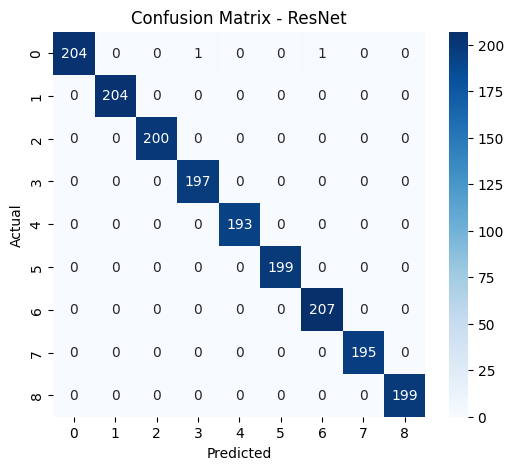

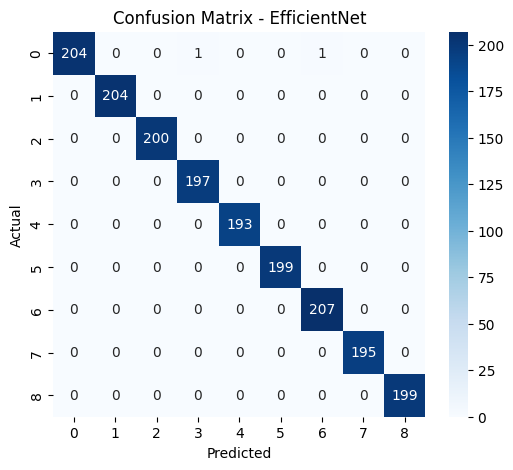

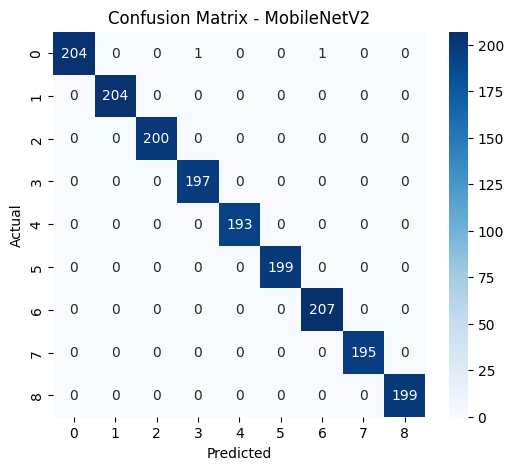

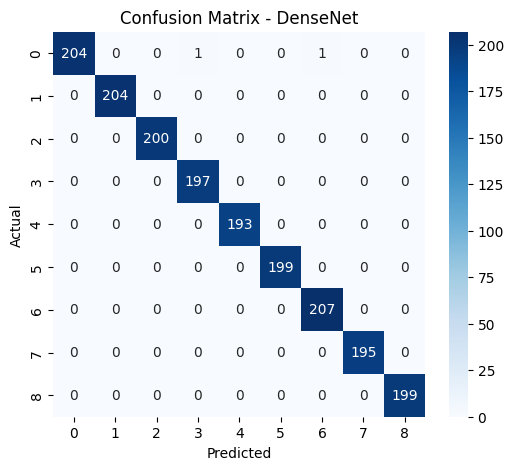

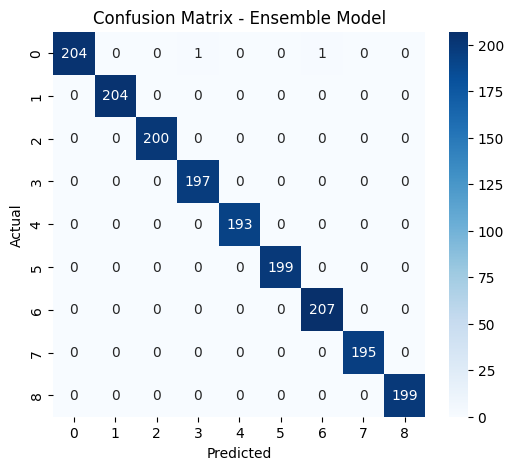

In [ ]:

# ------------------------------------------
# Evaluate Models with Precision, Recall, F1 Score, and Confusion Matrix
# ------------------------------------------
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


# Evaluate each base model
for model in models_list:
    # Confusion Matrix
    cm = confusion_matrix(true_labels, predictions)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model.__class__.__name__}')
    plt.show()

# Confusion Matrix for Ensemble Model
cm = confusion_matrix(true_labels, predictions)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Ensemble Model')
plt.show()


## Grad-CAM Visualization

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


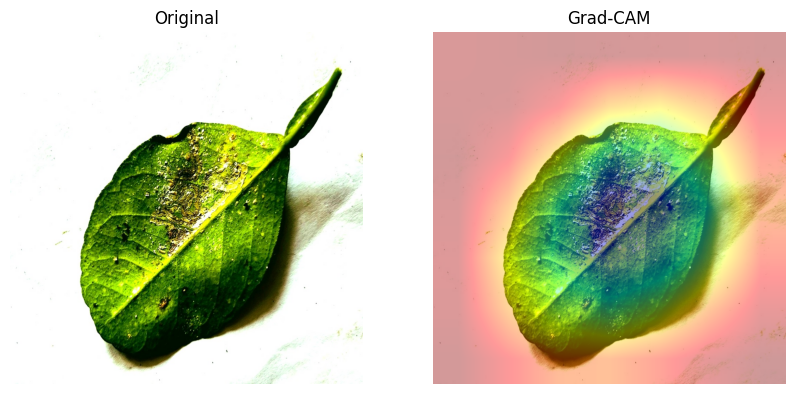

In [ ]:
# ------------------------------------------
# XAI: Grad-CAM Visualization
# ------------------------------------------
def visualize_gradcam(img_path, ensemble, models_list):
    ensemble.eval()
    img = Image.open(img_path).convert('RGB')
    input_tensor = transform(img).unsqueeze(0).to(device)

    heatmaps = []
    weights = torch.softmax(ensemble.weights, dim=0).detach().cpu().numpy()

    target_layers = [
        models_list[0].layer4[-1],
        models_list[1].features[-1],
        models_list[2].features[-1],
        models_list[3].features[-1]
    ]

    for model, layer, w in zip(models_list, target_layers, weights):
        grads, acts = None, None
        def forward_hook(module, inp, out):
            nonlocal acts
            acts = out.detach()
        def backward_hook(module, gin, gout):
            nonlocal grads
            grads = gout[0].detach()

        hook_f = layer.register_forward_hook(forward_hook)
        hook_b = layer.register_backward_hook(backward_hook)

        model.zero_grad()
        out = model(input_tensor)
        out[:, out.argmax(dim=1)].backward()

        pooled_grad = grads.mean([0, 2, 3])
        cam = (acts[0] * pooled_grad[:, None, None]).sum(0).relu()
        cam = cam / cam.max()
        heatmaps.append(w * cam.cpu().numpy())

        hook_f.remove()
        hook_b.remove()

    final_heatmap = np.sum(heatmaps, axis=0)
    final_heatmap = cv2.resize(final_heatmap, (img.width, img.height))
    heatmap = cv2.applyColorMap(np.uint8(255 * final_heatmap), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(np.array(img), 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title('Original')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title('Grad-CAM')
    plt.axis('off')
    plt.show()

# Example usage:
img_path = '/kaggle/input/lemon-leaf-disease-dataset/Augmented Dataset/Aumented Dataset/Bacterial Blight/Bacterial Blight00001.JPG'
visualize_gradcam(img_path, ensemble_model, models_list)


## Ablation-CAM Visualization

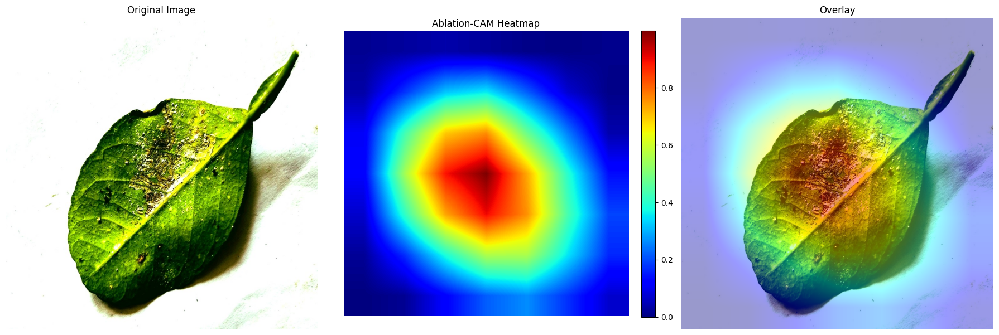

In [ ]:
def visualize_ablationcam_improved(img_path, ensemble, models_list, colormap=cv2.COLORMAP_JET, alpha=0.4):
    """
    Improved Ablation-CAM visualization that shows:
      - Original image
      - Ensemble Ablation-CAM heatmap with a colorbar
      - Overlay of the heatmap on the original image

    Args:
      img_path (str): Path to the input image.
      ensemble (nn.Module): The ensemble model containing the weights.
      models_list (list): List of base models.
      colormap: OpenCV colormap to apply (default: cv2.COLORMAP_JET).
      alpha (float): Transparency factor for overlay blending.
    """
    ensemble.eval()
    # Load and preprocess image
    img = Image.open(img_path).convert('RGB')
    input_tensor = transform(img).unsqueeze(0).to(device)

    heatmaps = []
    # Get ensemble weights as probabilities
    weights = torch.softmax(ensemble.weights, dim=0).detach().cpu().numpy()

    # Define target layers from each model
    target_layers = [
        models_list[0].layer4[-1],
        models_list[1].features[-1],
        models_list[2].features[-1],
        models_list[3].features[-1]
    ]

    # Compute Ablation-CAM for each model
    for model, layer, w in zip(models_list, target_layers, weights):
        # Capture the activation for the forward pass.
        activation = None
        def forward_hook(module, inp, out):
            nonlocal activation
            activation = out.detach()
        hook = layer.register_forward_hook(forward_hook)
        output = model(input_tensor)
        predicted_class = output.argmax(dim=1).item()
        original_score = output[0, predicted_class].item()
        hook.remove()

        # Compute channel importance via ablation.
        channel_importance = []
        num_channels = activation.shape[1]
        for c in range(num_channels):
            def ablate_hook(module, inp, out):
                ablated = out.clone()
                ablated[:, c, :, :] = 0
                return ablated
            hook = layer.register_forward_hook(ablate_hook)
            output_ablated = model(input_tensor)
            ablated_score = output_ablated[0, predicted_class].item()
            importance = original_score - ablated_score
            channel_importance.append(importance)
            hook.remove()
        channel_importance = torch.tensor(channel_importance, device=device)

        # Aggregate the activation maps weighted by the channel importance.
        weighted_activation = (activation[0] * channel_importance.view(-1, 1, 1)).sum(dim=0)
        cam = weighted_activation.relu()
        # Normalize the cam to [0,1]
        cam_min, cam_max = cam.min(), cam.max()
        if cam_max - cam_min > 0:
            cam = (cam - cam_min) / (cam_max - cam_min)
        else:
            cam = torch.zeros_like(cam)
        heatmaps.append(w * cam.cpu().numpy())

    # Aggregate and normalize heatmaps from all models.
    ensemble_heatmap = np.sum(heatmaps, axis=0)
    heat_min, heat_max = ensemble_heatmap.min(), ensemble_heatmap.max()
    if heat_max - heat_min > 0:
        ensemble_heatmap = (ensemble_heatmap - heat_min) / (heat_max - heat_min)
    else:
        ensemble_heatmap = np.zeros_like(ensemble_heatmap)

    # Resize the heatmap to the image size.
    ensemble_heatmap_resized = cv2.resize(ensemble_heatmap, (img.width, img.height))

    # Apply colormap and convert to RGB.
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * ensemble_heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Create overlay image.
    img_np = np.array(img)
    overlay = cv2.addWeighted(img_np, 1 - alpha, heatmap_colored, alpha, 0)

    # Plotting: Original, Heatmap (with colorbar), and Overlay.
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].imshow(img)
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    im = axs[1].imshow(ensemble_heatmap_resized, cmap='jet')
    axs[1].set_title('Ablation-CAM Heatmap')
    axs[1].axis('off')
    fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)

    axs[2].imshow(overlay)
    axs[2].set_title('Overlay')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()


# Example usage:
img_path = '/kaggle/input/lemon-leaf-disease-dataset/Augmented Dataset/Aumented Dataset/Bacterial Blight/Bacterial Blight00001.JPG'
visualize_ablationcam_improved(img_path, ensemble_model, models_list)


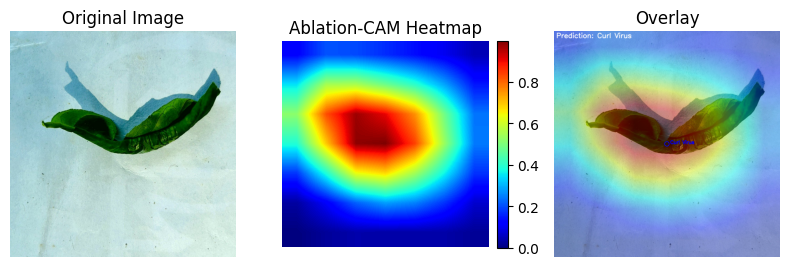

In [ ]:
def visualize_ablationcam_improved(img_path, ensemble, models_list, colormap=cv2.COLORMAP_JET, alpha=0.4, class_names=None):
    """
    Improved Ablation-CAM visualization that shows:
      - Original image
      - Ensemble Ablation-CAM heatmap with a colorbar
      - Overlay of the heatmap on the original image with predicted class annotations

    Args:
      img_path (str): Path to the input image.
      ensemble (nn.Module): The ensemble model containing the weights.
      models_list (list): List of base models.
      colormap: OpenCV colormap to apply (default: cv2.COLORMAP_JET).
      alpha (float): Transparency factor for overlay blending.
      class_names (dict or list, optional): Mapping of class indices to class names.
    """
    ensemble.eval()
    # Load and preprocess image
    img = Image.open(img_path).convert('RGB')
    input_tensor = transform(img).unsqueeze(0).to(device)

    # Compute ensemble prediction for annotation.
    ensemble_output = ensemble(input_tensor)
    ensemble_pred = ensemble_output.argmax(dim=1).item()
    label_text = class_names[ensemble_pred] if class_names is not None else str(ensemble_pred)

    heatmaps = []
    # Get ensemble weights as probabilities
    weights = torch.softmax(ensemble.weights, dim=0).detach().cpu().numpy()

    # Define target layers from each model
    target_layers = [
        models_list[0].layer4[-1],
        models_list[1].features[-1],
        models_list[2].features[-1],
        models_list[3].features[-1]
    ]

    # Compute Ablation-CAM for each model
    for model, layer, w in zip(models_list, target_layers, weights):
        # Capture the activation for the forward pass.
        activation = None
        def forward_hook(module, inp, out):
            nonlocal activation
            activation = out.detach()
        hook = layer.register_forward_hook(forward_hook)
        output = model(input_tensor)
        # Use the predicted class of each base model for ablation.
        predicted_class = output.argmax(dim=1).item()
        original_score = output[0, predicted_class].item()
        hook.remove()

        # Compute channel importance via ablation.
        channel_importance = []
        num_channels = activation.shape[1]
        for c in range(num_channels):
            def ablate_hook(module, inp, out):
                ablated = out.clone()
                ablated[:, c, :, :] = 0
                return ablated
            hook = layer.register_forward_hook(ablate_hook)
            output_ablated = model(input_tensor)
            ablated_score = output_ablated[0, predicted_class].item()
            importance = original_score - ablated_score
            channel_importance.append(importance)
            hook.remove()
        channel_importance = torch.tensor(channel_importance, device=device)

        # Aggregate the activation maps weighted by the channel importance.
        weighted_activation = (activation[0] * channel_importance.view(-1, 1, 1)).sum(dim=0)
        cam = weighted_activation.relu()
        # Normalize the cam to [0,1]
        cam_min, cam_max = cam.min(), cam.max()
        if cam_max - cam_min > 0:
            cam = (cam - cam_min) / (cam_max - cam_min)
        else:
            cam = torch.zeros_like(cam)
        heatmaps.append(w * cam.cpu().numpy())

    # Aggregate and normalize heatmaps from all models.
    ensemble_heatmap = np.sum(heatmaps, axis=0)
    heat_min, heat_max = ensemble_heatmap.min(), ensemble_heatmap.max()
    if heat_max - heat_min > 0:
        ensemble_heatmap = (ensemble_heatmap - heat_min) / (heat_max - heat_min)
    else:
        ensemble_heatmap = np.zeros_like(ensemble_heatmap)

    # Resize the heatmap to the image size.
    ensemble_heatmap_resized = cv2.resize(ensemble_heatmap, (img.width, img.height))

    # Apply colormap and convert to RGB.
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * ensemble_heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Create overlay image.
    img_np = np.array(img)
    overlay = cv2.addWeighted(img_np, 1 - alpha, heatmap_colored, alpha, 0)

    # Annotate the predicted class on the overlay.
    cv2.putText(overlay, f'Prediction: {label_text}', (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

    # Find the area with the highest activation and annotate it.
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(ensemble_heatmap_resized)
    cv2.circle(overlay, max_loc, 10, (0, 0, 255), 2)
    cv2.putText(overlay, label_text, (max_loc[0] + 15, max_loc[1]),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2, cv2.LINE_AA)

    # Plotting: Original, Heatmap (with colorbar), and Overlay.
    fig, axs = plt.subplots(1, 3, figsize=(8, 6))

    axs[0].imshow(img)
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    im = axs[1].imshow(ensemble_heatmap_resized, cmap='jet')
    axs[1].set_title('Ablation-CAM Heatmap')
    axs[1].axis('off')
    fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)

    axs[2].imshow(overlay)
    axs[2].set_title('Overlay')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:
# Optionally provide a class_names mapping (e.g., a dict or list)
img_path = '/kaggle/input/lemon-leaf-disease-dataset/Augmented Dataset/Aumented Dataset/Curl Virus/Curl Virus00004.JPG'
visualize_ablationcam_improved(img_path, ensemble_model, models_list,class_names={0: "Anthracnose",
                                                                     1: "Bacterial Blight",
                                                                     2: "Citrus Canker",
                                                                     3: "Curl Virus",
                                                                     4: "Deficiency Leaf",
                                                                     5: "Dry Leaf",
                                                                     6: "Healthy Leaf",
                                                                     7: "Sooty Mould",
                                                                     8: "Spider Mites"})

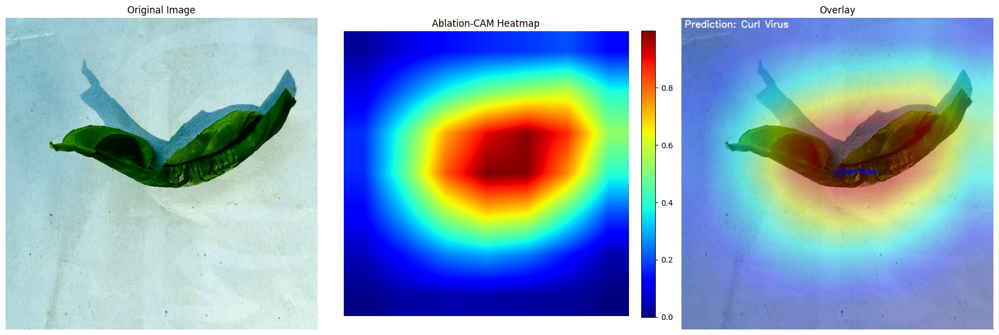

In [ ]:
def visualize_ablationcam_improved(img_path, ensemble, models_list, colormap=cv2.COLORMAP_JET, alpha=0.4, class_names=None):
    """
    Improved Ablation-CAM visualization that shows:
      - Original image
      - Ensemble Ablation-CAM heatmap with a colorbar
      - Overlay of the heatmap on the original image with predicted class annotations

    Args:
      img_path (str): Path to the input image.
      ensemble (nn.Module): The ensemble model containing the weights.
      models_list (list): List of base models.
      colormap: OpenCV colormap to apply (default: cv2.COLORMAP_JET).
      alpha (float): Transparency factor for overlay blending.
      class_names (dict or list, optional): Mapping of class indices to class names.
    """
    ensemble.eval()
    # Load and preprocess image
    img = Image.open(img_path).convert('RGB')
    input_tensor = transform(img).unsqueeze(0).to(device)

    # Compute ensemble prediction for annotation.
    ensemble_output = ensemble(input_tensor)
    ensemble_pred = ensemble_output.argmax(dim=1).item()
    label_text = class_names[ensemble_pred] if class_names is not None else str(ensemble_pred)

    heatmaps = []
    # Get ensemble weights as probabilities
    weights = torch.softmax(ensemble.weights, dim=0).detach().cpu().numpy()

    # Define target layers from each model
    target_layers = [
        models_list[0].layer4[-1],
        models_list[1].features[-1],
        models_list[2].features[-1],
        models_list[3].features[-1]
    ]

    # Compute Ablation-CAM for each model
    for model, layer, w in zip(models_list, target_layers, weights):
        # Capture the activation for the forward pass.
        activation = None
        def forward_hook(module, inp, out):
            nonlocal activation
            activation = out.detach()
        hook = layer.register_forward_hook(forward_hook)
        output = model(input_tensor)
        # Use the predicted class of each base model for ablation.
        predicted_class = output.argmax(dim=1).item()
        original_score = output[0, predicted_class].item()
        hook.remove()

        # Compute channel importance via ablation.
        channel_importance = []
        num_channels = activation.shape[1]
        for c in range(num_channels):
            def ablate_hook(module, inp, out):
                ablated = out.clone()
                ablated[:, c, :, :] = 0
                return ablated
            hook = layer.register_forward_hook(ablate_hook)
            output_ablated = model(input_tensor)
            ablated_score = output_ablated[0, predicted_class].item()
            importance = original_score - ablated_score
            channel_importance.append(importance)
            hook.remove()
        channel_importance = torch.tensor(channel_importance, device=device)

        # Aggregate the activation maps weighted by the channel importance.
        weighted_activation = (activation[0] * channel_importance.view(-1, 1, 1)).sum(dim=0)
        cam = weighted_activation.relu()
        # Normalize the cam to [0,1]
        cam_min, cam_max = cam.min(), cam.max()
        if cam_max - cam_min > 0:
            cam = (cam - cam_min) / (cam_max - cam_min)
        else:
            cam = torch.zeros_like(cam)
        heatmaps.append(w * cam.cpu().numpy())

    # Aggregate and normalize heatmaps from all models.
    ensemble_heatmap = np.sum(heatmaps, axis=0)
    heat_min, heat_max = ensemble_heatmap.min(), ensemble_heatmap.max()
    if heat_max - heat_min > 0:
        ensemble_heatmap = (ensemble_heatmap - heat_min) / (heat_max - heat_min)
    else:
        ensemble_heatmap = np.zeros_like(ensemble_heatmap)

    # Resize the heatmap to the image size.
    ensemble_heatmap_resized = cv2.resize(ensemble_heatmap, (img.width, img.height))

    # Apply colormap and convert to RGB.
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * ensemble_heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Create overlay image.
    img_np = np.array(img)
    overlay = cv2.addWeighted(img_np, 1 - alpha, heatmap_colored, alpha, 0)

    # Annotate the predicted class on the overlay.
    cv2.putText(overlay, f'Prediction: {label_text}', (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

    # Find the area with the highest activation and annotate it.
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(ensemble_heatmap_resized)
    cv2.circle(overlay, max_loc, 10, (0, 0, 255), 2)
    cv2.putText(overlay, label_text, (max_loc[0] + 15, max_loc[1]),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2, cv2.LINE_AA)

    # Plotting: Original, Heatmap (with colorbar), and Overlay.
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].imshow(img)
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    im = axs[1].imshow(ensemble_heatmap_resized, cmap='jet')
    axs[1].set_title('Ablation-CAM Heatmap')
    axs[1].axis('off')
    fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)

    axs[2].imshow(overlay)
    axs[2].set_title('Overlay')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:
# Optionally provide a class_names mapping (e.g., a dict or list)
img_path = '/kaggle/input/lemon-leaf-disease-dataset/Augmented Dataset/Aumented Dataset/Curl Virus/Curl Virus00004.JPG'
visualize_ablationcam_improved(img_path, ensemble_model, models_list,class_names={0: "Anthracnose",
                                                                     1: "Bacterial Blight",
                                                                     2: "Citrus Canker",
                                                                     3: "Curl Virus",
                                                                     4: "Deficiency Leaf",
                                                                     5: "Dry Leaf",
                                                                     6: "Healthy Leaf",
                                                                     7: "Sooty Mould",
                                                                     8: "Spider Mites"})

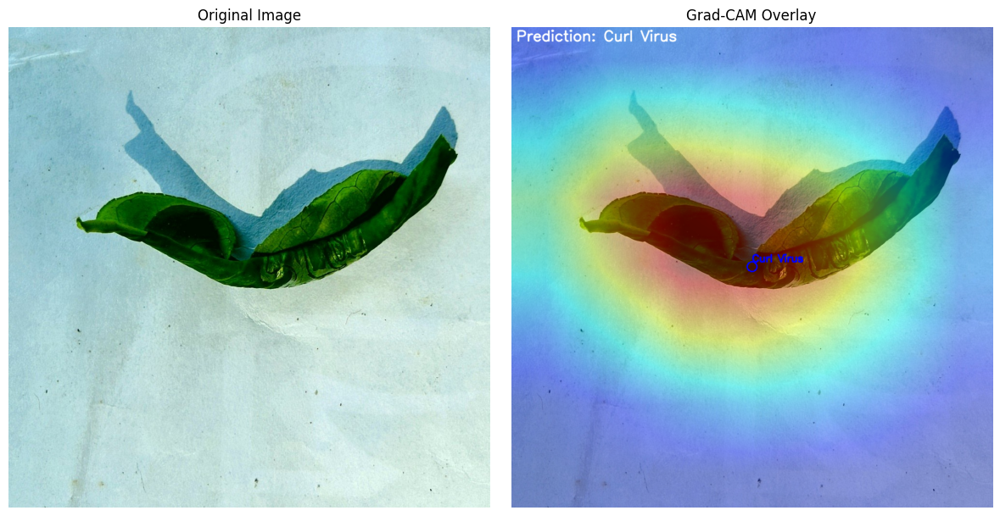

In [ ]:
def visualize_gradcam(img_path, ensemble, models_list, class_names=None):
    ensemble.eval()
    # Load and preprocess image
    img = Image.open(img_path).convert('RGB')
    input_tensor = transform(img).unsqueeze(0).to(device)

    # Get ensemble prediction and label
    ensemble_output = ensemble(input_tensor)
    pred_class = ensemble_output.argmax(dim=1).item()
    if class_names is not None:
        label_text = class_names[pred_class]
    else:
        label_text = str(pred_class)

    heatmaps = []
    weights = torch.softmax(ensemble.weights, dim=0).detach().cpu().numpy()

    target_layers = [
        models_list[0].layer4[-1],
        models_list[1].features[-1],
        models_list[2].features[-1],
        models_list[3].features[-1]
    ]

    # Compute Grad-CAM for each model in the ensemble
    for model, layer, w in zip(models_list, target_layers, weights):
        grads, acts = None, None

        # Hook functions to capture activations and gradients
        def forward_hook(module, inp, out):
            nonlocal acts
            acts = out.detach()
        def backward_hook(module, gin, gout):
            nonlocal grads
            grads = gout[0].detach()

        hook_f = layer.register_forward_hook(forward_hook)
        hook_b = layer.register_backward_hook(backward_hook)

        model.zero_grad()
        out = model(input_tensor)
        # Backward pass using the score of the predicted class
        out[:, out.argmax(dim=1)].backward()

        # Compute the Grad-CAM heatmap for the current model
        pooled_grad = grads.mean([0, 2, 3])
        cam = (acts[0] * pooled_grad[:, None, None]).sum(0).relu()
        cam = cam / cam.max()
        heatmaps.append(w * cam.cpu().numpy())

        hook_f.remove()
        hook_b.remove()

    # Combine the weighted heatmaps from each model
    final_heatmap = np.sum(heatmaps, axis=0)
    final_heatmap = cv2.resize(final_heatmap, (img.width, img.height))

    # Create a color heatmap and convert to RGB for correct display
    heatmap = cv2.applyColorMap(np.uint8(255 * final_heatmap), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(np.array(img), 0.6, heatmap_rgb, 0.4, 0)

    # Annotate the predicted class label on the overlay
    cv2.putText(overlay, f'Prediction: {label_text}', (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

    # Find the area with the highest activation and annotate it
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(final_heatmap)
    cv2.circle(overlay, max_loc, 10, (0, 0, 255), 2)
    cv2.putText(overlay, f'{label_text}', (max_loc[0], max_loc[1]-10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2, cv2.LINE_AA)

    # Plot original image and Grad-CAM overlay
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title('Grad-CAM Overlay')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Example usage:

img_path = '/kaggle/input/lemon-leaf-disease-dataset/Augmented Dataset/Aumented Dataset/Curl Virus/Curl Virus00004.JPG'
visualize_gradcam(img_path, ensemble_model, models_list,class_names={0: "Anthracnose",
                                                                     1: "Bacterial Blight",
                                                                     2: "Citrus Canker",
                                                                     3: "Curl Virus",
                                                                     4: "Deficiency Leaf",
                                                                     5: "Dry Leaf",
                                                                     6: "Healthy Leaf",
                                                                     7: "Sooty Mould",
                                                                     8: "Spider Mites"})